### COMP 3610 Project

In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler as scaler
import numpy as np
from sklearn.neighbors import KNeighborsRegressor

In [2]:
df_original = pd.read_csv('Solar Dataset.csv')

In [3]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2920 entries, 0 to 2919
Data columns (total 16 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Day of Year                           2920 non-null   int64  
 1   Year                                  2920 non-null   int64  
 2   Month                                 2920 non-null   int64  
 3   Day                                   2920 non-null   int64  
 4   First Hour of Period                  2920 non-null   int64  
 5   Is Daylight                           2920 non-null   bool   
 6   Distance to Solar Noon                2920 non-null   float64
 7   Average Temperature (Day)             2920 non-null   int64  
 8   Average Wind Direction (Day)          2920 non-null   int64  
 9   Average Wind Speed (Day)              2920 non-null   float64
 10  Sky Cover                             2920 non-null   int64  
 11  Visibility       

Removing null entries and converting bool column to int.

In [19]:
df_original = df_original.dropna(how = 'any', axis =0)
df_original['Is Daylight'] = df_original['Is Daylight'].astype(int)
df_trim= df_original#.drop(['Average Barometric Pressure (Period)', 'Visibility'], axis=1)

Creating synthetic data using KKN Regressor

In [20]:
required_size = 5000
current_size = df_trim.shape[0]
extra_needed = required_size - current_size

# Separate features and target variable
X = df_trim.drop(columns=["Power Generated"])  # Features
y = df_trim["Power Generated"]  # Target

# Train KNN Regressor
knn = KNeighborsRegressor(n_neighbors=3)
knn.fit(X, y)

unique_hours = df_trim['First Hour of Period'].unique()
num_unique_hours = len(unique_hours)


# Generate synthetic samples
synthetic_X = []
synthetic_y = []
synthetic_hours = []

for i in range(extra_needed):
    idx = np.random.randint(0, current_size)  # Pick a random real sample
    real_sample = X.iloc[idx].to_frame().T  # Keeps feature names
    synthetic_sample = knn.predict(real_sample)  # Predict new value
    synthetic_X.append(real_sample.values[0])  
    synthetic_y.append(synthetic_sample[0])
    synthetic_hours.append(unique_hours[i % num_unique_hours])
# Convert synthetic data to DataFrame
df_synthetic = pd.DataFrame(synthetic_X, columns=X.columns)
df_synthetic["Power Generated"] = synthetic_y
df_synthetic['First Hour of Period'] = synthetic_hours

# Combine with original dataset
df_extended = pd.concat([df_trim, df_synthetic], ignore_index=True)


# Print dataset sizes
print(f"Original dataset size: {current_size}")
print(f"New dataset size: {df_extended.shape[0]}")

Original dataset size: 2919
New dataset size: 5000


In [22]:
df_extended.to_csv('synthetic_dataset')

In [23]:
df = pd.read_csv("synthetic_dataset.csv")

Evaluating the synthetic data

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
X = df_original.drop(columns=["Power Generated"])
y = df_original["Power Generated"]

X_ext = df.drop(columns=["Power Generated"])
y_ext = df["Power Generated"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
X_train_ext, X_test_ext, y_train_ext, y_test_ext = train_test_split(X_ext, y_ext, test_size=0.2)

# Train the model on both datasets
model_real = RandomForestRegressor( )
model_real.fit(X_train, y_train)

model_extended = RandomForestRegressor()
model_extended.fit(X_train_ext, y_train_ext)

# Make predictions
y_pred_real = model_real.predict(X_test)
y_pred_extended = model_extended.predict(X_test_ext)

# Compute SSE (Sum of Squared Errors)
sse_real = np.sum((y_test - y_pred_real) ** 2)
sse_extended = np.sum((y_test_ext - y_pred_extended) ** 2)

# Compute MSE (Mean Squared Error)
mse_real = mean_absolute_error(y_test, y_pred_real)
mse_extended = mean_absolute_error(y_test_ext, y_pred_extended)

# Print results
print(f"Original Data SSE: {sse_real:.4f}")
print(f"Extended Data SSE: {sse_extended:.4f}")
print(f"Original Data MSE: {mse_real:.4f}")
print(f"Extended Data MSE: {mse_extended:.4f}")

Original Data SSE: 6327007069.6146
Extended Data SSE: 12651176223.9553
Original Data MSE: 1513.0473
Extended Data MSE: 2175.9793


In [12]:
import matplotlib.pyplot as plt 
import seaborn as sns

Comparing the Distribution of Particular Features

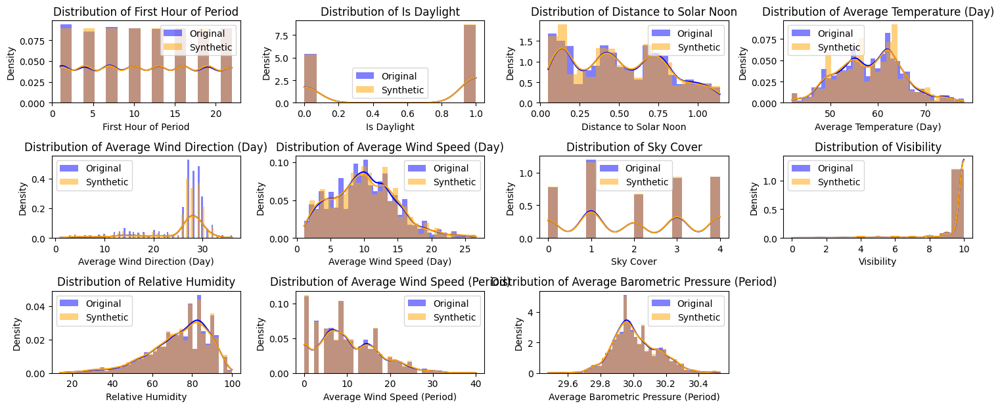

In [25]:
feature_columns = [
   "First Hour of Period", "Is Daylight",
    "Distance to Solar Noon", "Average Temperature (Day)", "Average Wind Direction (Day)", 
    "Average Wind Speed (Day)", "Sky Cover", "Visibility", "Relative Humidity", 
    "Average Wind Speed (Period)", "Average Barometric Pressure (Period)"
]

# Plot histograms for each feature to compare distributions
plt.figure(figsize=(15, 10))
for i, col in enumerate(feature_columns, 1):
    plt.subplot(5, 4, i)
    sns.histplot(df[col], kde=True, color='blue', label='Original', stat='density', linewidth=0)
    sns.histplot(df_extended[col], kde=True, color='orange', label='Synthetic', stat='density', linewidth=0)
    plt.title(f'Distribution of {col}')
    plt.legend()

plt.tight_layout()
plt.show()

In [26]:
df_extended['Is Daylight'] = df_extended['Is Daylight'].astype(int)

Correlation Analysis of relevant features

In [27]:
features = feature_columns + ['Power Generated']
correlation_matrix = df_extended[features].corr()
print(correlation_matrix['Power Generated'].sort_values(ascending=False))

Power Generated                         1.000000
Is Daylight                             0.538951
Average Wind Speed (Period)             0.292137
Average Wind Direction (Day)            0.154346
Average Wind Speed (Day)                0.146950
Average Temperature (Day)               0.139316
Visibility                              0.092716
First Hour of Period                    0.054915
Average Barometric Pressure (Period)   -0.042196
Sky Cover                              -0.200083
Relative Humidity                      -0.558028
Distance to Solar Noon                 -0.726690
Name: Power Generated, dtype: float64


In [28]:
feature_importances = model_extended.feature_importances_
features = X.columns

Random Foreest Feature Importance Analysis

In [29]:
filtered_importances = [importance for feature, importance in zip(features, feature_importances) if feature in feature_columns]

feature_importance_df = pd.DataFrame({"Feature": feature_columns, "Importance": filtered_importances})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

print(feature_importance_df)

                                 Feature  Importance
2                 Distance to Solar Noon    0.760416
8                      Relative Humidity    0.090067
6                              Sky Cover    0.039812
4           Average Wind Direction (Day)    0.023875
5               Average Wind Speed (Day)    0.017777
10  Average Barometric Pressure (Period)    0.011414
3              Average Temperature (Day)    0.009775
9            Average Wind Speed (Period)    0.009633
0                   First Hour of Period    0.004320
7                             Visibility    0.001375
1                            Is Daylight    0.000082


In [30]:
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])

## Exploratory Visualisations

#### Trend in Power Generation over Time

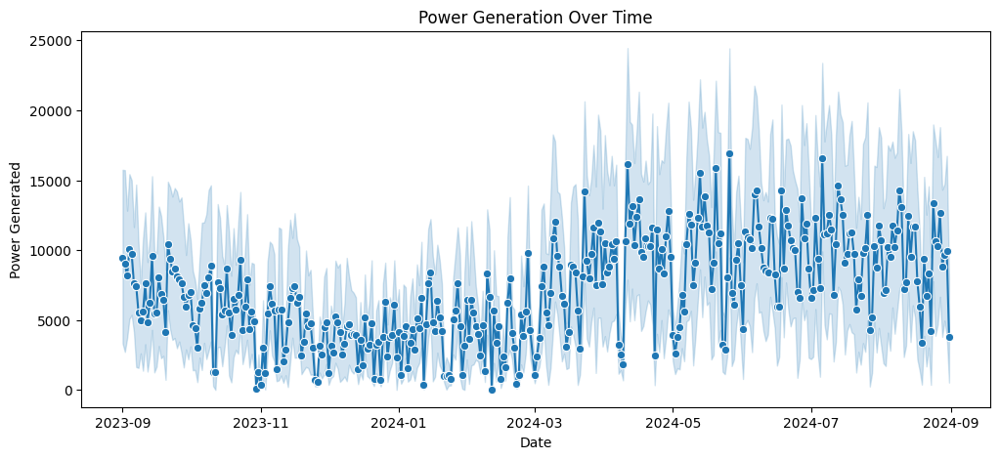

In [31]:
plt.figure(figsize=(12, 5))
sns.lineplot(x='Date', y='Power Generated', data=df, marker='o')
plt.title('Power Generation Over Time')
plt.xlabel('Date')
plt.ylabel('Power Generated')
plt.show()

#### Distribution of Power Generated by Months

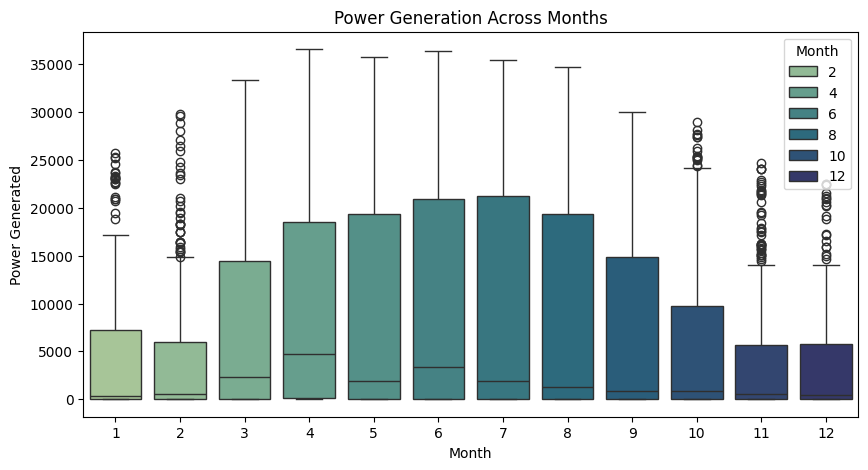

In [32]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='Month', y='Power Generated', data=df, palette = 'crest', hue = 'Month')
plt.title('Power Generation Across Months')
plt.xlabel('Month')
plt.ylabel('Power Generated')
plt.show()

#### Power Versus Temperature/Wind Speed/Humidity

Text(0.5, 1.0, 'Power vs Humidity')

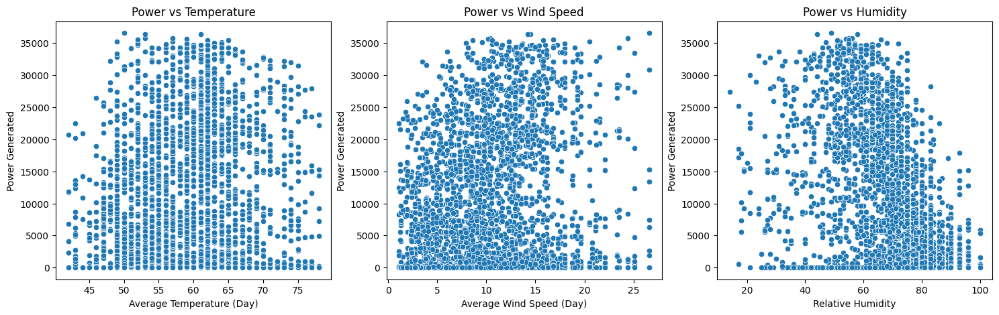

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.scatterplot(x='Average Temperature (Day)', y='Power Generated', data=df, ax=axes[0])
axes[0].set_title('Power vs Temperature')

sns.scatterplot(x='Average Wind Speed (Day)', y='Power Generated', data=df, ax=axes[1])
axes[1].set_title('Power vs Wind Speed')

sns.scatterplot(x='Relative Humidity', y='Power Generated', data=df, ax=axes[2])
axes[2].set_title('Power vs Humidity')

#### Important Feature Correlation

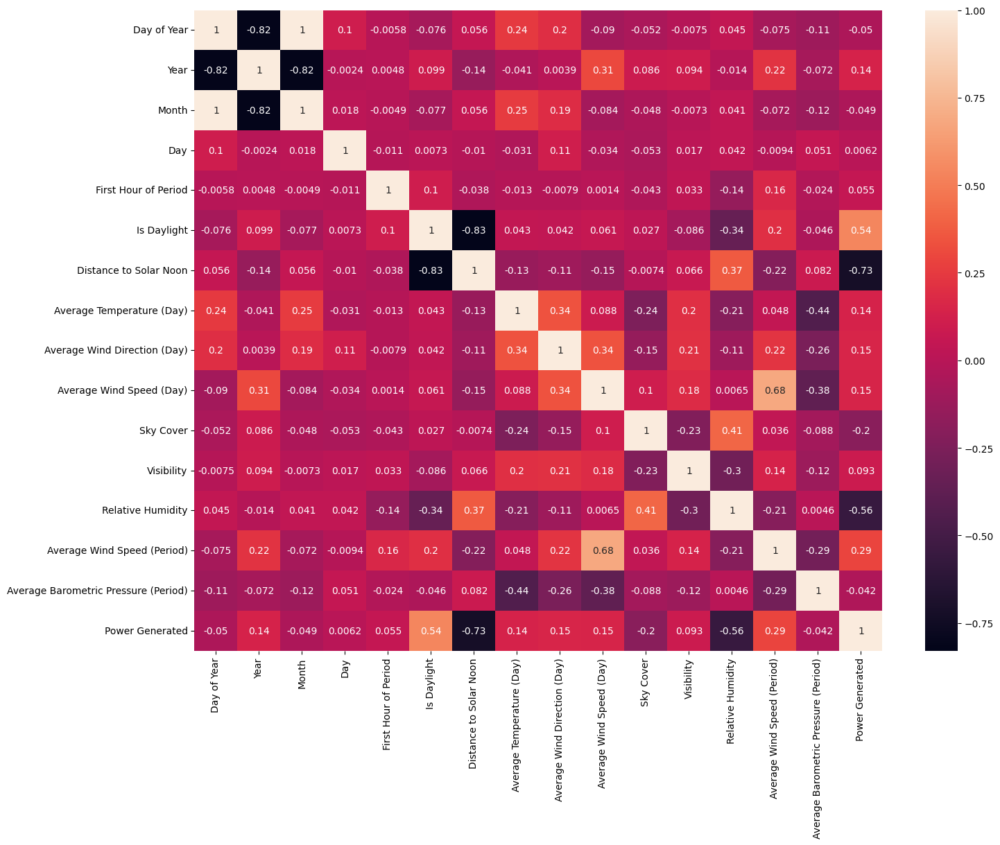

In [34]:
plt.figure(figsize = (16,12))
sns.heatmap(df_extended.corr(), annot = True)
plt.show()

#### Analysing Average Power Generated by Wind Direction

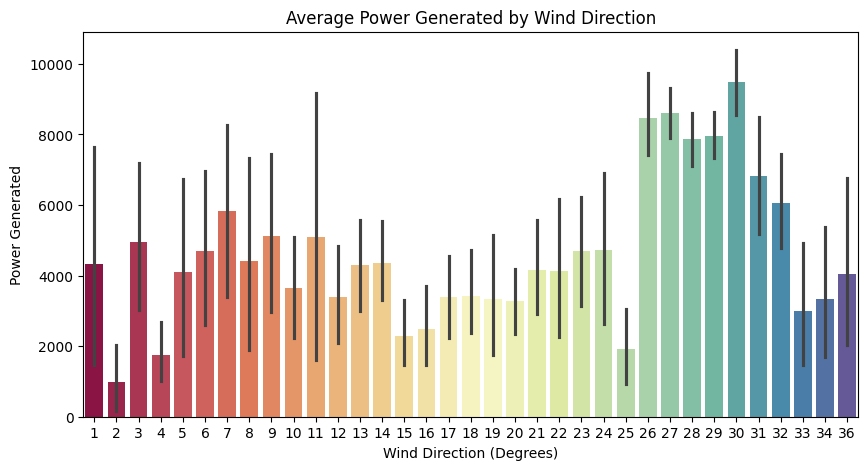

In [35]:
plt.figure(figsize=(10, 5))
sns.barplot(x='Average Wind Direction (Day)', y='Power Generated', data=df, palette = 'Spectral', hue = 'Average Wind Direction (Day)', legend = False)
plt.xticks(rotation=0)
plt.title('Average Power Generated by Wind Direction')
plt.xlabel('Wind Direction (Degrees)')
plt.ylabel('Power Generated')
plt.show()

#### Comparing Power Generation during thje Day versus at Night

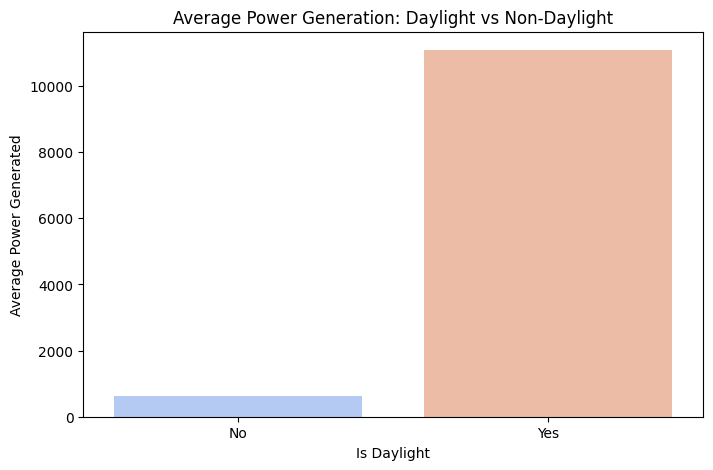

In [44]:
avg_power_daylight = df.groupby('Is Daylight')['Power Generated'].mean().reset_index()

# Create bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x='Is Daylight', y='Power Generated', data=avg_power_daylight, palette='coolwarm', hue = 'Is Daylight', legend = False)

plt.xlabel('Is Daylight')
plt.ylabel('Average Power Generated')
plt.title('Average Power Generation: Daylight vs Non-Daylight')
plt.xticks([0, 1], ['No', 'Yes'])  # Ensure proper labels

plt.show()

#### Observing the Relationship between Wind Direction, Wind Speed and Power Generation

In [37]:
import plotly.express as px

In [38]:
fig = px.scatter_polar(df, r='Average Wind Speed (Day)', theta='Average Wind Direction (Day)',
                        size='Power Generated', color='Power Generated',
                        title="Wind Direction vs Wind Speed vs Power Generation",
                        color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

#### Comparing Power Generated against Distance to Solar Moon (Midday)

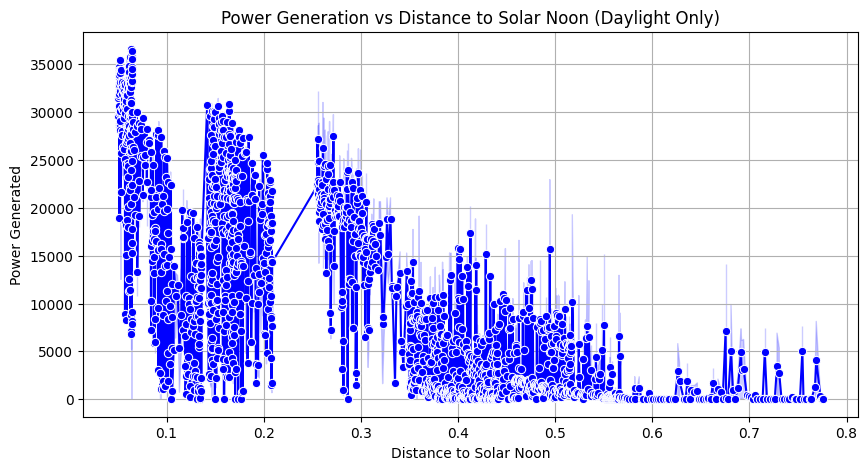

In [40]:
df_daylight = df[(df['Is Daylight'] == 1)].copy()

df_daylight = df_daylight.sort_values(by='Distance to Solar Noon')

plt.figure(figsize=(10, 5))
sns.lineplot(x='Distance to Solar Noon', y='Power Generated', data=df_daylight, marker='o', color='b')

plt.xlabel('Distance to Solar Noon')
plt.ylabel('Power Generated')
plt.title('Power Generation vs Distance to Solar Noon (Daylight Only)')
plt.grid(True)

plt.show()

#### Average Power Generation by Hour

In [41]:
avg_power_by_hour = df.groupby("First Hour of Period")["Power Generated"].mean()

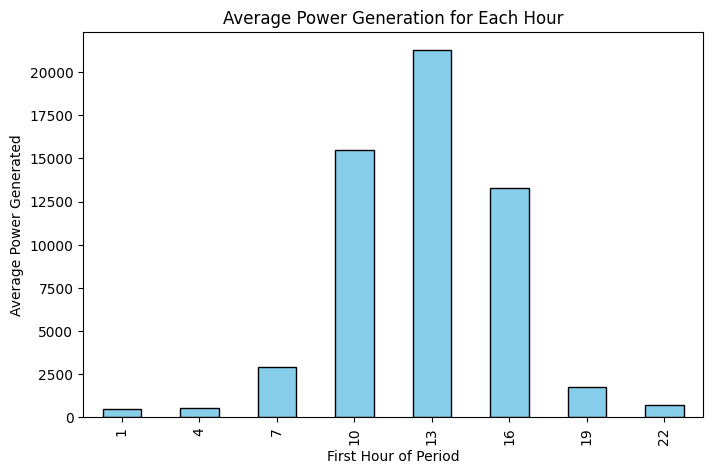

In [43]:
plt.figure(figsize=(8, 5))
avg_power_by_hour.plot(kind="bar", color="skyblue", edgecolor="black")

# Labels and title
plt.xlabel("First Hour of Period")
plt.ylabel("Average Power Generated")
plt.title("Average Power Generation for Each Hour")
plt.xticks(rotation=0)  # Keep labels readable

# Show plot
plt.show()